In [25]:
from PIL import Image
import numpy as np
import pandas as pd

def convert(img_path):
    
    image = Image.open(img_path)
    image = image.convert("RGB")
    
    image_array = np.array(image)
    
    dataset = []
    
    for i in range(len(image_array)):
        for j in range(len(image_array[i])):
            
            pixel = image_array[i][j]
            if not np.array_equal(pixel, [0,0,0]):               
                if pixel[0] < pixel[2] - 20:
                    dataset.append((j, 500 - i, 1))
                elif pixel[0] - 20 > pixel[2]:
                    dataset.append((j, 500 - i, 0))
                
    dataset = pd.DataFrame(dataset)
    return dataset

img_path = "data.png"

dataset = convert(img_path)

# Wizualizacja zbioru danych

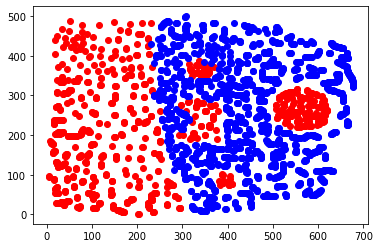

In [26]:
import matplotlib.pyplot as plt

df0 = dataset.loc[dataset.iloc[:, 2] == 0]
df1 = dataset.loc[dataset.iloc[:, 2] == 1]

class1_y = df0.iloc[:, 1]
class1_x = df0.iloc[:, 0]

class2_y =  df1.iloc[:, 1]
class2_x =  df1.iloc[:, 0]

plt.scatter(class1_x, class1_y, c='red')
plt.scatter(class2_x, class2_y, c='blue')

plt.show()

In [27]:
from matplotlib.colors import ListedColormap

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.svm import SVC
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.metrics.pairwise import cosine_similarity

from math import sqrt

names = []
classifiers = []

In [28]:
names.append("Linear")
classifiers.append(make_pipeline(StandardScaler(), SVC(kernel="linear", C=0.025, gamma='auto')))

In [29]:
def incomplete_dot_product(X, Y):
    if Y is None:
        Y = X

    res = []
    for i, x in enumerate(X):
        res.append([])
        for y in Y:
            res[i].append(x[0] * y[0])

    return np.array(res)

names.append("Incomplete dot product")
classifiers.append(make_pipeline(StandardScaler(), SVC(kernel=incomplete_dot_product, C=0.025, gamma='auto')))

In [30]:
names.append("RBF")
classifiers.append(make_pipeline(StandardScaler(), SVC(kernel="rbf", C=0.025, gamma='auto')))

In [31]:
def jump(X, Y):
    if Y is None:
        Y = X

    R = 1
    res = []

    for i, x in enumerate(X):
        res.append([])
        for y in Y:
            res[i].append(1 if np.sqrt((x[0] - y[0]) ** 2 + (x[1] - y[1]) ** 2) <= R else 0)

    return np.array(res)

names.append("Jump type")
classifiers.append(make_pipeline(StandardScaler(), SVC(kernel=jump, C=0.025, gamma='auto')))

In [32]:
def hinge(X, Y):
    if Y is None:
        Y = X

    R = 1
    res = []

    for i, x in enumerate(X):
        res.append([])
        for y in Y:
            k = np.sqrt((x[0] - y[0]) ** 2 + (x[1] - y[1]) ** 2)
            res[i].append(1 - k / R if k <= R else 0)

    return res

names.append("Hinge type")
classifiers.append(make_pipeline(StandardScaler(), SVC(kernel=hinge, C=0.025, gamma='auto')))

In [33]:
def angle(X, Y):
    if Y is None:
        Y = X
        
    center = np.array([350, 250])
    diff = X - center

    similarities = cosine_similarity(diff, Y)
    return similarities

names.append("Angle type")
classifiers.append(make_pipeline(StandardScaler(), SVC(kernel=angle, C=0.025, gamma='auto')))

In [36]:
def distance_between_class_borders(clf):
    xx = np.linspace(-5, 5)
    w = clf.coef_[0]
    a = -w[0] / w[1]
    yy = a * xx - (clf.intercept_[0]) / w[1]

    margin = 1 / np.sqrt(np.sum(clf.coef_ ** 2))
    yy_down = yy - np.sqrt(1 + a ** 2) * margin
    yy_up = yy + np.sqrt(1 + a ** 2) * margin

    p11 = (xx[3], yy_down[3])
    p12 = (xx[4], yy_down[4])
    p21 = (xx[3], yy_up[3])
    p22 = (xx[4], yy_up[4])

    x11, y11 = p11
    x12, y12 = p12

    a1 = round((y11 - y12) / (x11 - x12), 5)
    b1 = y11 - a1 * x11

    x21, y21 = p21
    x22, y22 = p22

    a2 = round((y21 - y22) / (x21 - x22), 5)
    b2 = y21 - a2 * x21

    return abs(b1 - b2) / sqrt(a2 * a1 + 1)

Linear
Indices of chosen support vectors for name=Linear: [   0    6    7 ... 2893 2895 2900]
Incomplete dot product
Indices of chosen support vectors for name=Incomplete dot product: [   0    7    8 ... 2893 2895 2900]
RBF
Indices of chosen support vectors for name=RBF: [   0    7    8 ... 2886 2889 2895]
Jump type
Indices of chosen support vectors for name=Jump type: [   0    7    8 ... 2886 2889 2895]
Hinge type
Indices of chosen support vectors for name=Hinge type: [   0    3    5 ... 2886 2889 2899]
Angle type
Indices of chosen support vectors for name=Angle type: [   0    3    5 ... 2893 2895 2900]


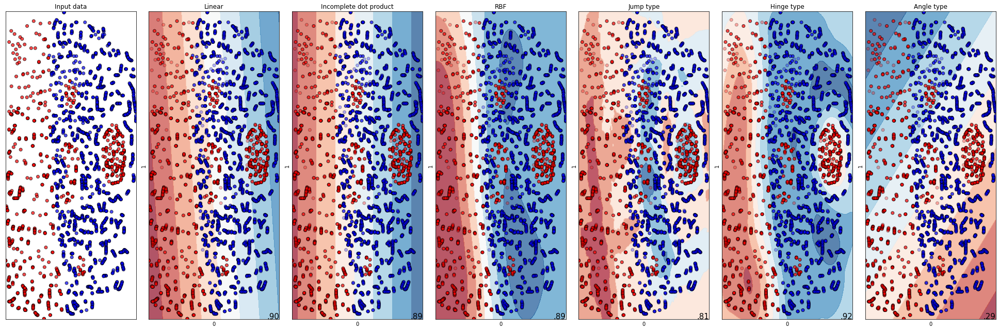

In [38]:
figure = plt.figure(figsize=(27, 9))

i = 1
ds_cnt = 0
ds = dataset

X, y = ds.iloc[:, 0:2], ds.iloc[:, 2]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

x_min, x_max = X[:][0].min() - 0.5, X[:][0].max() + 0.5
y_min, y_max = X[:][1].min() - 0.5, X[:][1].max() + 0.5

x, y = X_train.iloc[:, 0], X_train.iloc[:, 1]

# just plot the dataset first
cm = plt.cm.RdBu
cm_bright = ListedColormap(['#FF0000', '#0000FF'])
ax = plt.subplot(1, len(classifiers) + 1, i)
ax.set_title("Input data")
ax.scatter(x, y, c=y_train, cmap=cm_bright, edgecolors='k', alpha=0.7)
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
ax.set_xticks(())
ax.set_yticks(())

i += 1

# iterate over classifiers
for name, clf in zip(names, classifiers):
    print(name)
    ax = plt.subplot(1, len(classifiers) + 1, i)

    clf.fit(X_train, y_train)
    score = clf.score(X_test, y_test)
    
    support_vectors = clf.get_params()['svc'].support_
    print(f'Indices of chosen support vectors for name={name}: {support_vectors}')

    DecisionBoundaryDisplay.from_estimator(clf, X, ax=ax, eps=0.5, alpha=0.7, cmap=cm)

    # plot the training points
    ax.scatter(x, y, c=y_train, cmap=cm_bright, edgecolors='k', alpha=0.7)

    # and testing points
    ax.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], c=y_test, cmap=cm_bright, edgecolors='k', alpha=0.3)

    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_xticks(())
    ax.set_yticks(())

    if ds_cnt == 0:
        ax.set_title(name)

    ax.text(x_max - 0.3, y_min + 0.3, ('%.2f' % score).lstrip('0'), size=15, horizontalalignment='right')

    i += 1

plt.tight_layout()
plt.show()

W przypadku danych które nie są sepraowalne liniowo tak jak te w zadaniu kernele liniowe tzn. niowy, niepełny iloczyn skalarny oraz ten zalezny od kątów nie daja dobrych rezultatów. Pozostałe 3 dużo lepiej dopasowały się dodanych i nastepnie trzba dla niech dobrać parametry, żeby dawały jeszcze lepszy rezultat.

# Sprawdzanie różnych wartości kary dla liniowego SVM

In [39]:
def show_results(pipeline, score, title) -> None:
    ax = plt.subplot(1, 1, 1)

    DecisionBoundaryDisplay.from_estimator(pipeline, X, cmap=cm, alpha=0.8, ax=ax, eps=0.5, levels=10)

    ax.scatter(X_train[:][0], X_train[:][1], c=y_train, cmap=cm_bright, edgecolors="k")

    ax.scatter(X_test[:][0], X_test[:][1], c=y_test, cmap=cm_bright, alpha=0.4, edgecolors="k")

    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_xticks(())
    ax.set_yticks(())
    ax.set_title(title)
    ax.text(x_max - 0.3, y_min + 0.3, ("%.2f" % score).lstrip("0"), size=20, horizontalalignment="right")

    plt.tight_layout()
    plt.show()

Indices of chosen support vectors for C=0.0001: [   0    3    5 ... 2895 2897 2900]
Distance between class margins: 40.44009359361703


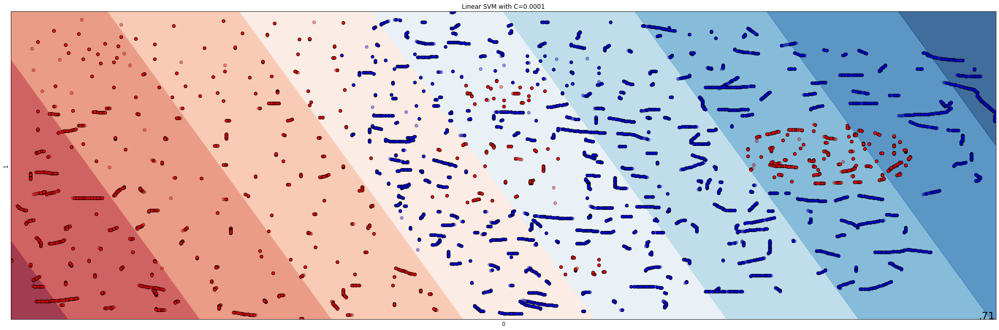

Indices of chosen support vectors for C=0.001: [   0    3    5 ... 2895 2897 2900]
Distance between class margins: 4.044129710627082


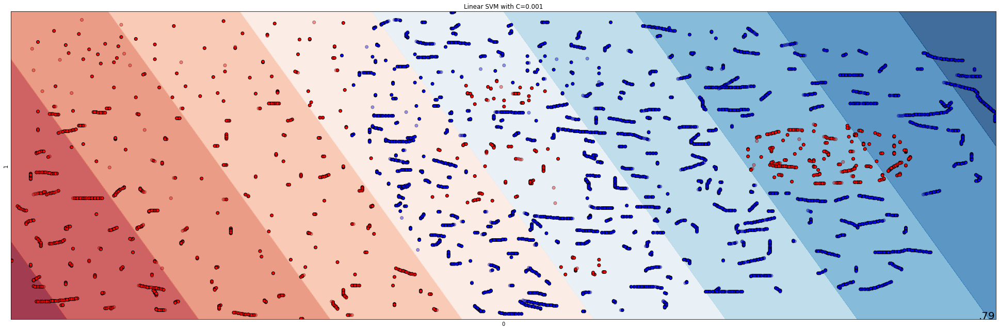

Indices of chosen support vectors for C=0.01: [   0    3    6 ... 2893 2895 2900]
Distance between class margins: 1.9533593540029446


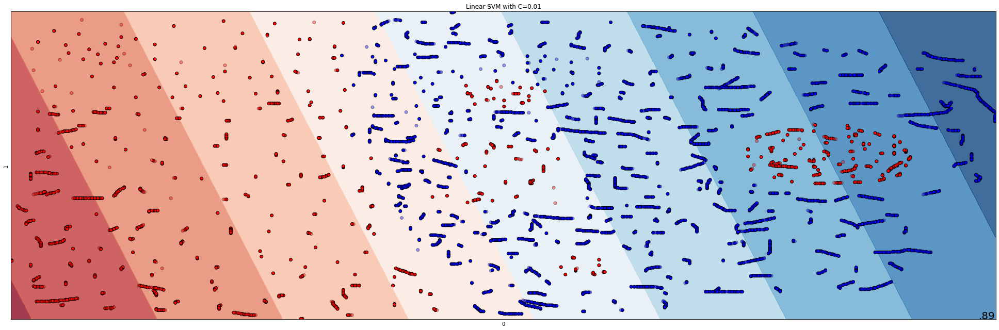

Indices of chosen support vectors for C=0.1: [   0    7    8 ... 2893 2895 2900]
Distance between class margins: 1.8442179090750173


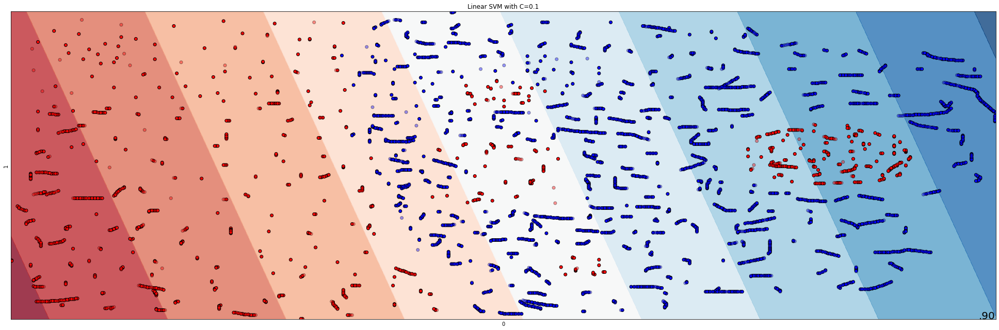

Indices of chosen support vectors for C=0.7: [   0    7    8 ... 2893 2895 2900]
Distance between class margins: 1.8266956685128057


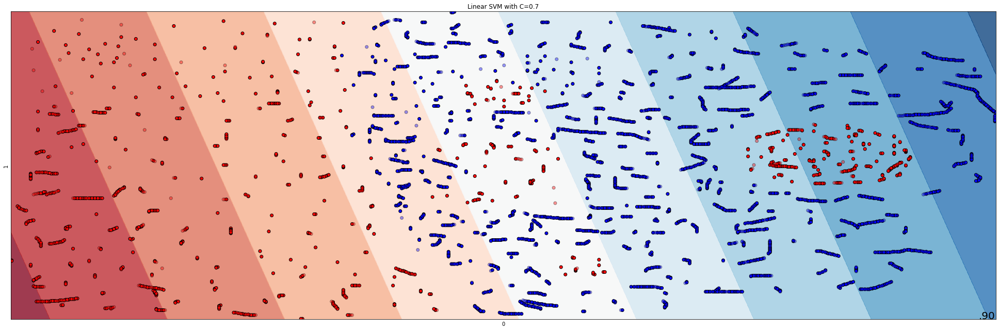

Indices of chosen support vectors for C=1: [   0    7    8 ... 2893 2895 2900]
Distance between class margins: 1.8235248326447757


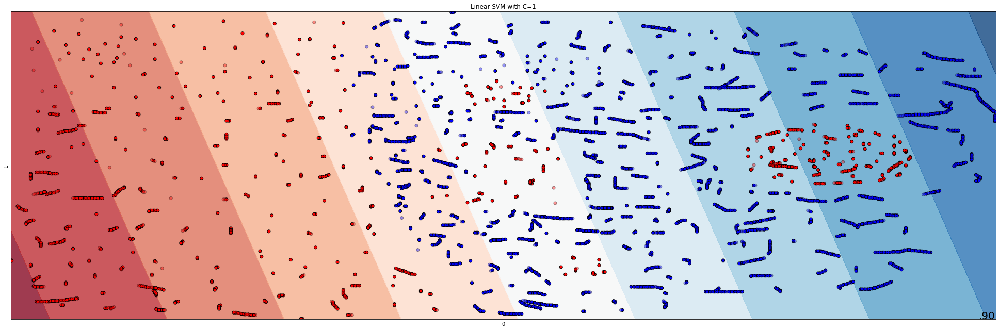

Indices of chosen support vectors for C=4: [   0    7    8 ... 2893 2895 2900]
Distance between class margins: 1.8237752890117034


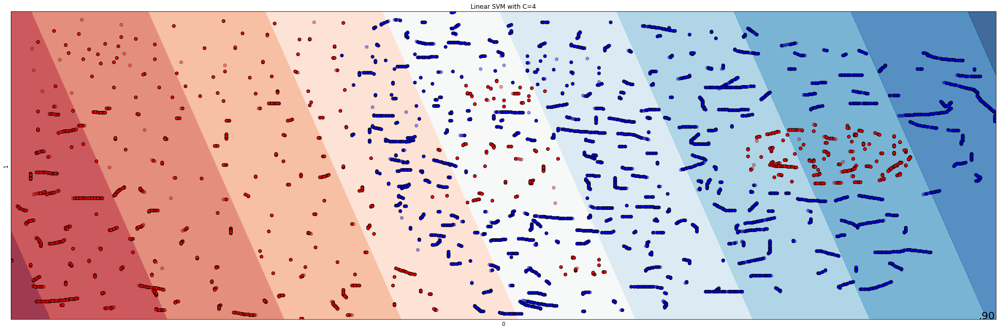

Indices of chosen support vectors for C=10: [   0    7    8 ... 2893 2895 2900]
Distance between class margins: 1.8233482482804655


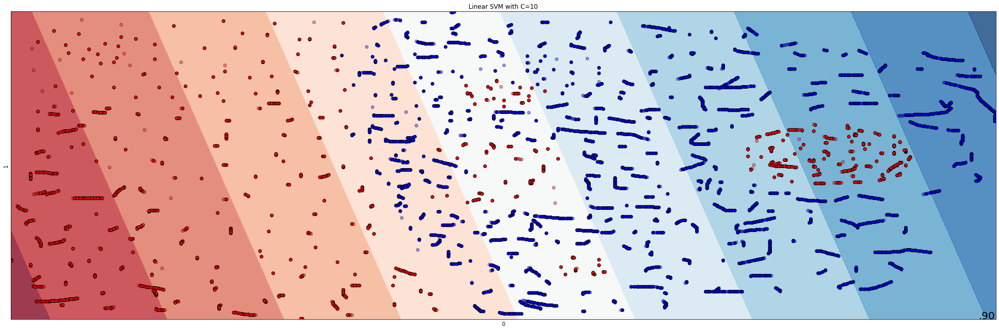

Indices of chosen support vectors for C=100: [   0    7    8 ... 2893 2895 2900]
Distance between class margins: 1.823333961163882


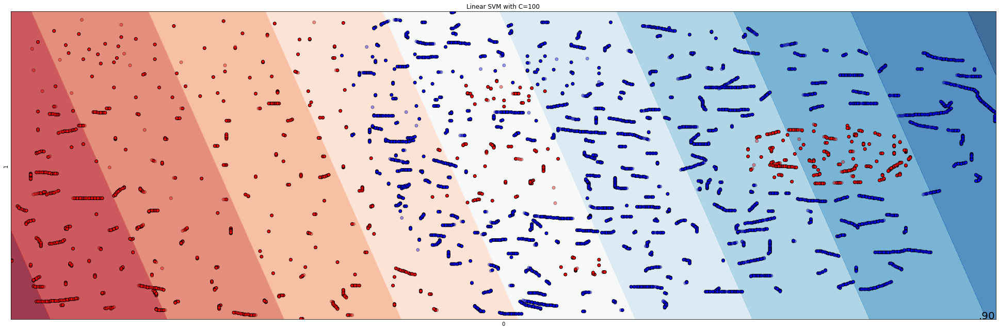

Indices of chosen support vectors for C=1000: [   0    7    8 ... 2893 2895 2900]
Distance between class margins: 1.8221826419807663


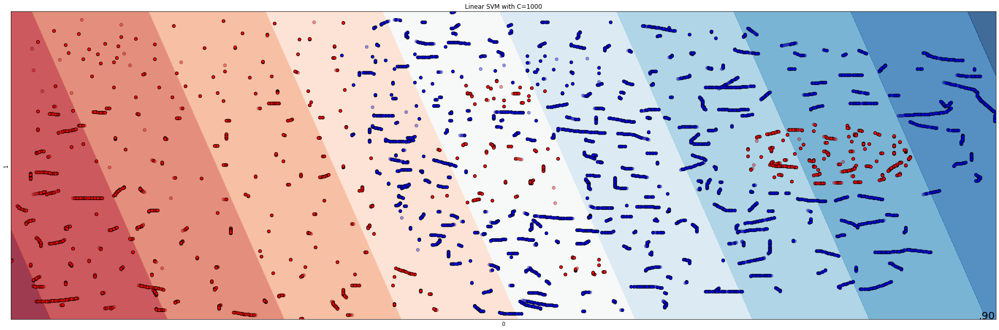

In [43]:
C_values = [0.0001, 0.001, 0.01, 0.1, 0.7, 1, 4, 10, 100, 1000]

for c in C_values:
    clf = make_pipeline(StandardScaler(), SVC(kernel="linear", C=c, random_state=1))

    clf.fit(X_train, y_train)
    support_vectors = clf.get_params()['svc'].support_
    print(f'Indices of chosen support vectors for C={c}: {support_vectors}')

    score = clf.score(X_test, y_test)

    figure = plt.figure(figsize=(27, 9))

    print(f"Distance between class margins: {distance_between_class_borders(clf.get_params()['svc'])}")
    show_results(clf, score, f"Linear SVM with C={c}")

# Sprawdzanie różnych wartości sigmy dla klasycznego kernela typy RBF

Indices of chosen support vectors for gamma=0.001: [   0    3    5 ... 2895 2897 2900]


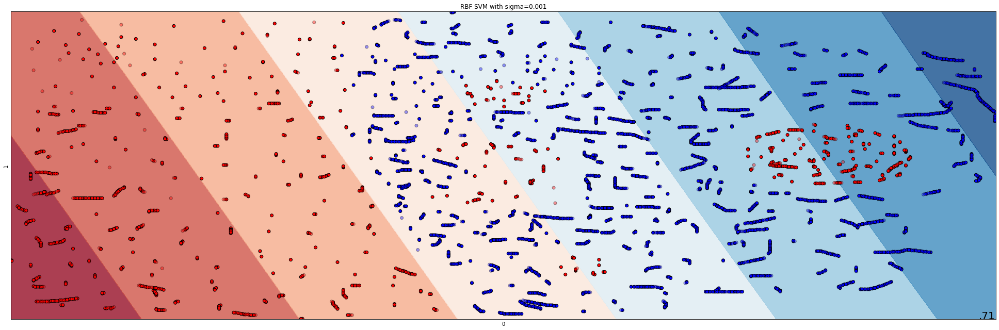

Indices of chosen support vectors for gamma=0.1: [   0    3    6 ... 2893 2895 2900]


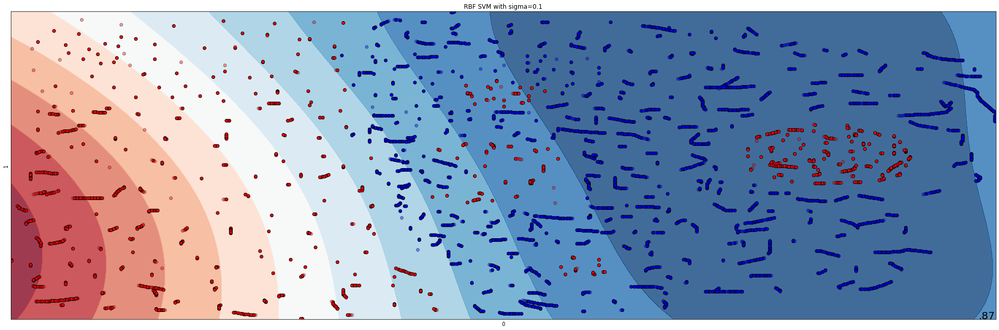

Indices of chosen support vectors for gamma=1: [   0    3    7 ... 2886 2889 2899]


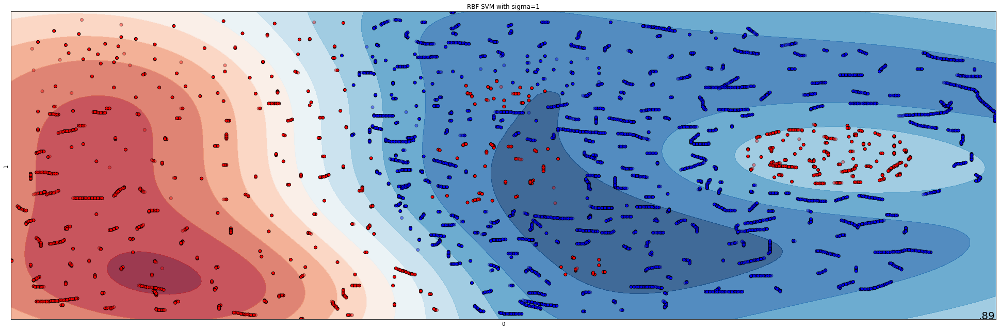

Indices of chosen support vectors for gamma=1.5: [   0    3    7 ... 2886 2889 2899]


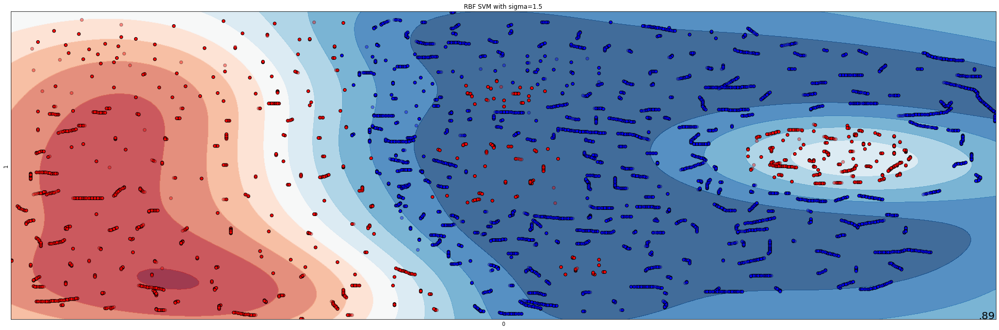

Indices of chosen support vectors for gamma=2: [   0    3    5 ... 2886 2889 2899]


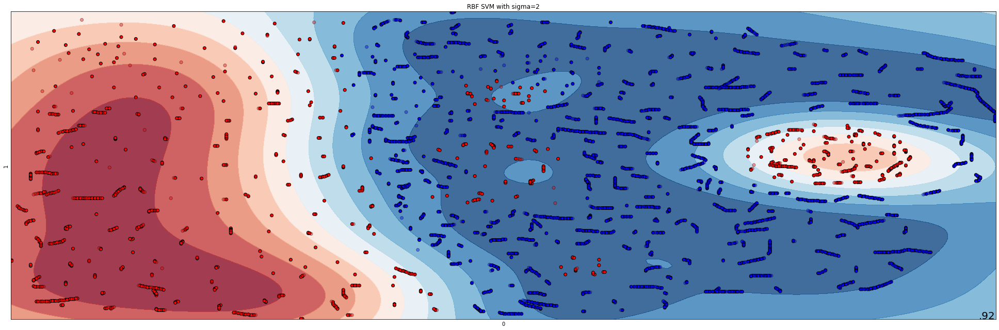

Indices of chosen support vectors for gamma=5: [   0    3    5 ... 2889 2897 2899]


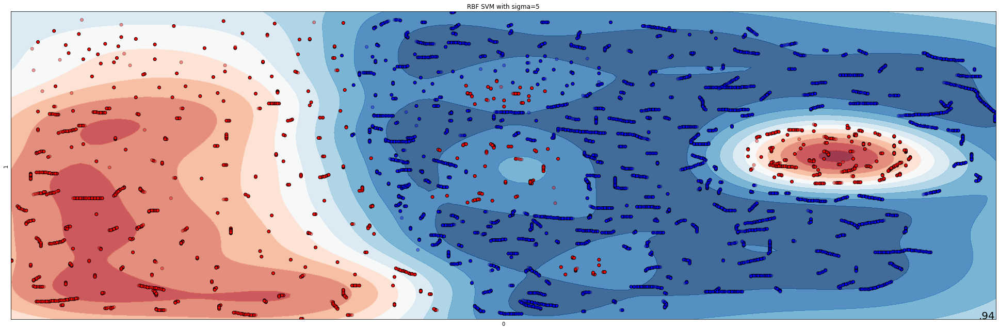

Indices of chosen support vectors for gamma=10: [   0    3    5 ... 2889 2898 2899]


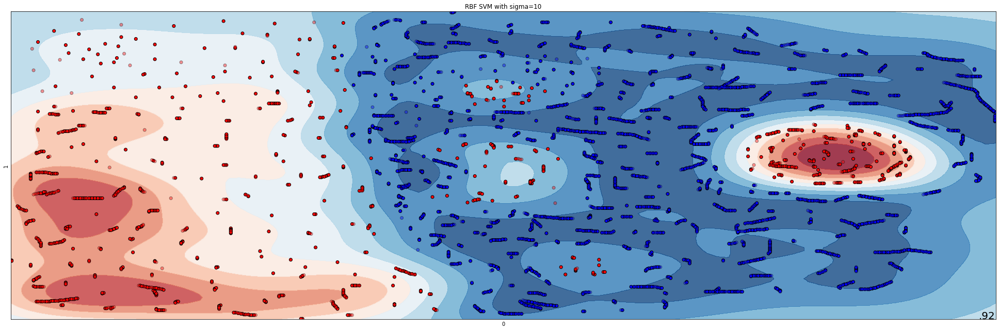

Indices of chosen support vectors for gamma=100: [   0    3    5 ... 2898 2900 2901]


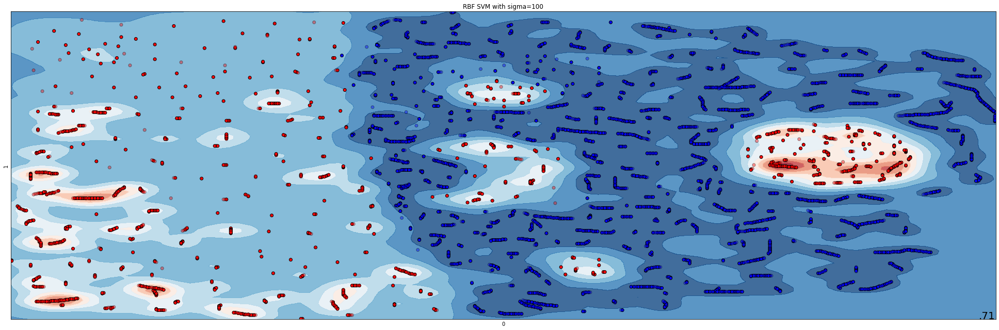

In [46]:
sigma_values = [0.001, 0.1, 1, 1.5, 2, 5, 10, 100]

for g in sigma_values:
    clf = make_pipeline(StandardScaler(), SVC(kernel="rbf", C=0.025, gamma=g, random_state=1))

    clf.fit(X_train, y_train)
    support_vectors = clf.get_params()['svc'].support_
    print(f'Indices of chosen support vectors for gamma={g}: {support_vectors}')

    score = clf.score(X_test, y_test)

    figure = plt.figure(figsize=(27, 9))

    show_results(clf, score, f"RBF SVM with sigma={g}")

# Sprawdzanie różnych wartości R dla kanciastego kernela typy RBF

In [50]:
def jump2(X, Y, rr):
    if Y is None:
        Y = X

    R = rr
    res = []

    for i, x in enumerate(X):
        res.append([])
        for y in Y:
            res[i].append(1 if np.sqrt((x[0] - y[0]) ** 2 + (x[1] - y[1]) ** 2) <= R else 0)

    return np.array(res)

Indices of chosen support vectors for R=0.001: [   0    3    5 ... 2899 2900 2901]


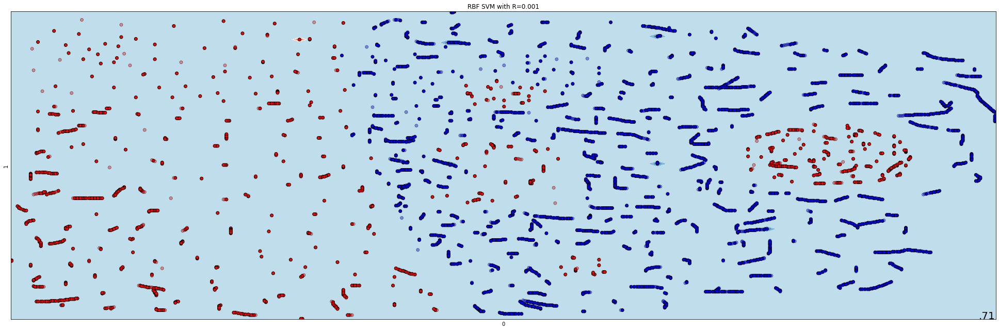

Indices of chosen support vectors for R=0.1: [   0    3    5 ... 2899 2900 2901]


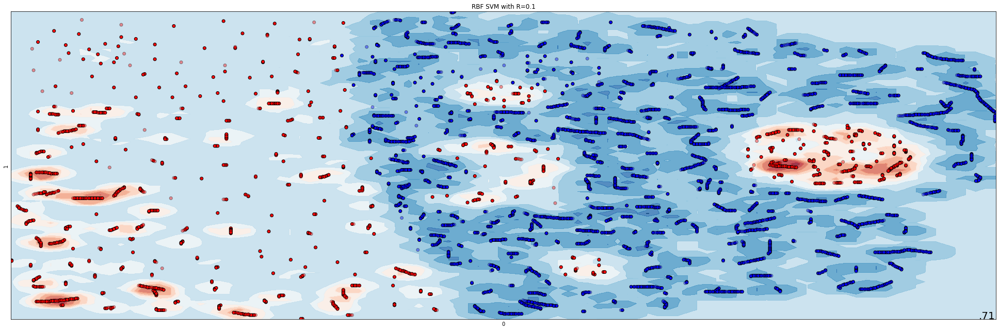

Indices of chosen support vectors for R=1: [   0    7    8 ... 2886 2889 2895]


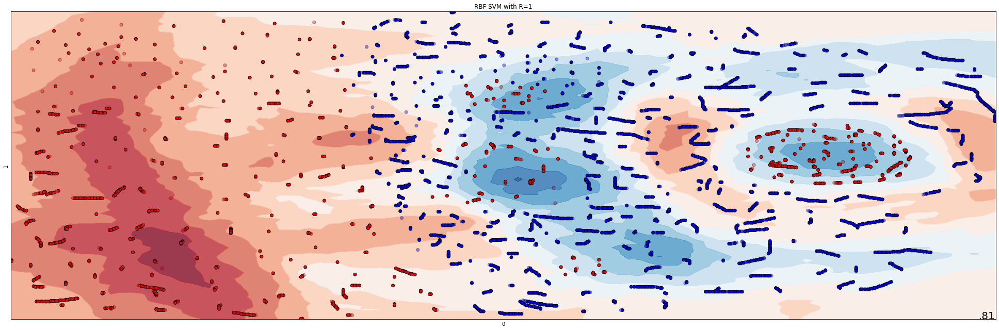

Indices of chosen support vectors for R=1.5: [   0    6    7 ... 2889 2898 2900]


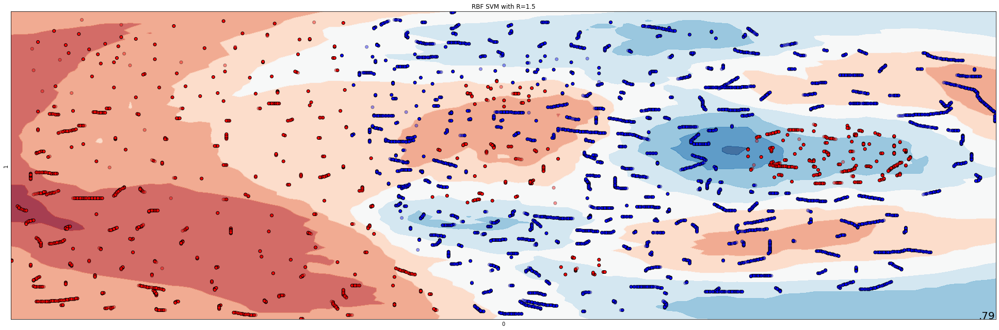

Indices of chosen support vectors for R=2: [   0    5    7 ... 2893 2897 2901]


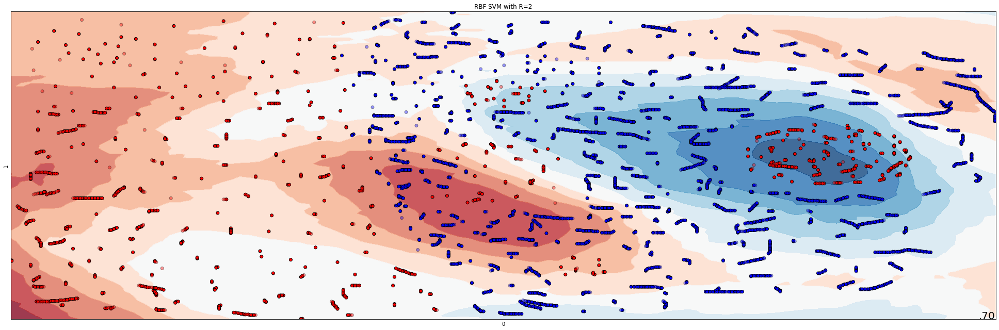

Indices of chosen support vectors for R=5: [   0    3    5 ... 2899 2900 2901]


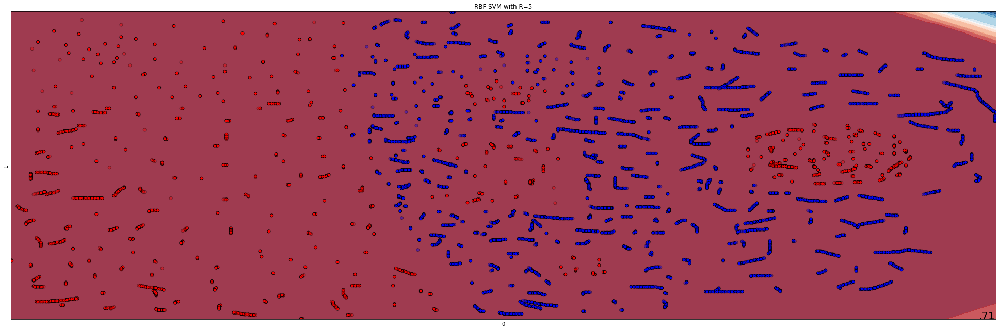

Indices of chosen support vectors for R=10: [   0    3    5 ... 2899 2900 2901]


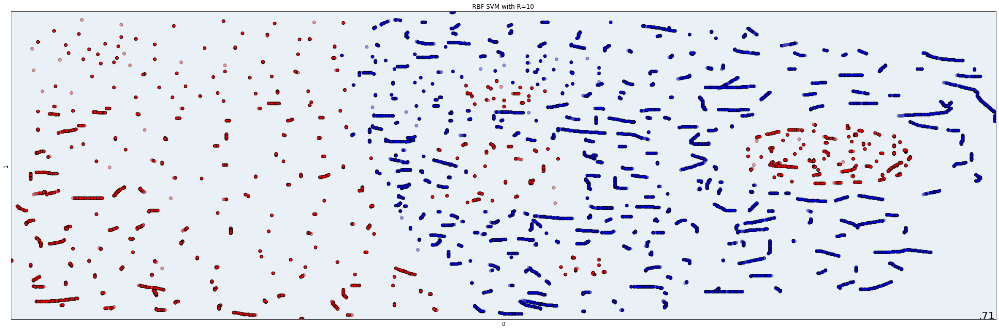

In [58]:
r_values = [0.001, 0.1, 1, 1.5, 2, 5, 10]

for r in r_values:
    
    def jump2(X, Y):
        global r
        if Y is None:
            Y = X

        R = r
        res = []

        for i, x in enumerate(X):
            res.append([])
            for y in Y:
                res[i].append(1 if np.sqrt((x[0] - y[0]) ** 2 + (x[1] - y[1]) ** 2) <= R else 0)

        return np.array(res)
    
    clf = make_pipeline(StandardScaler(), SVC(kernel=jump2 , C=0.025, random_state=1))

    clf.fit(X_train, y_train)
    support_vectors = clf.get_params()['svc'].support_
    print(f'Indices of chosen support vectors for R={r}: {support_vectors}')

    score = clf.score(X_test, y_test)

    figure = plt.figure(figsize=(27, 9))

    show_results(clf, score, f"RBF SVM with R={r}")

Indices of chosen support vectors for R=0.7: [   0    3    5 ... 2889 2890 2892]


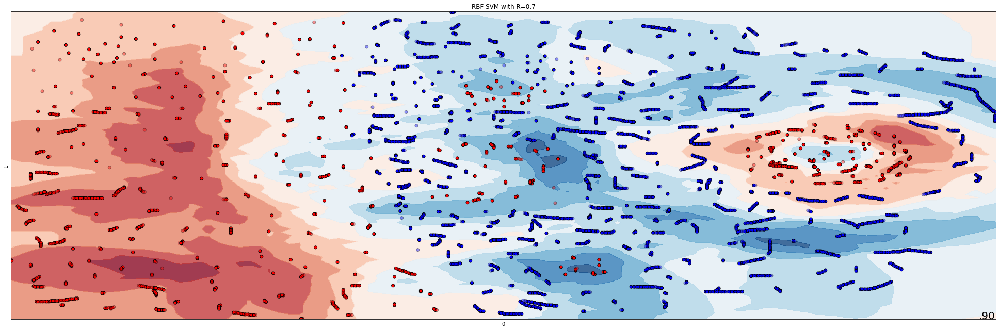

In [62]:
r = 0.7

def jump2(X, Y):
    global r
    if Y is None:
        Y = X

    R = r
    res = []

    for i, x in enumerate(X):
        res.append([])
        for y in Y:
            res[i].append(1 if np.sqrt((x[0] - y[0]) ** 2 + (x[1] - y[1]) ** 2) <= R else 0)

    return np.array(res)
    
clf = make_pipeline(StandardScaler(), SVC(kernel=jump2 , C=0.025, random_state=1))

clf.fit(X_train, y_train)
support_vectors = clf.get_params()['svc'].support_
print(f'Indices of chosen support vectors for R={r}: {support_vectors}')

score = clf.score(X_test, y_test)

figure = plt.figure(figsize=(27, 9))

show_results(clf, score, f"RBF SVM with R={r}")

# Podsumowanie

## Liniowy kernel

W przypadku kernela liniowego mozna zauważyć, że wartość współczynnika c jest odwrotnie proporcjonalna do odległości między marginesami klas. Dostosowując wartość tego współczynnika mozemy bardziej skupić się aby odpowiednie próbki były po dobrej stronie marginesu i wpadłu do odpowiednich klas.

## Klasyczny kernel RBF

W przypadku klasycznego kernela RBF wartość sigmy wpływa na stopień dopasowania do danych, więc bardzo duża sigma generuje nam overfiting. Jest to dobry wybór dla tego zbioru danych w przypadku gdy sigma ma wartośc między 2 - 5.


## Kanciasty kernel RBF

Podobnie jak w klasycznym RBF kanciasty przy pardzo małym lub bardzo dużym R przykłada duży nacisk na jedna klasę i rezultaty są nie dobre. Zatem tak jak poprzednio potrzeba regulacj parametru R. Najlepsze wyniki otrzymujemy w granicach R = 0.3-0.7.